In [1]:
import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Unzipping the file
import zipfile

local_zip = '/content/drive/MyDrive/Data/covidsplit.zip'
zipref = zipfile.ZipFile(local_zip, 'r')
zipref.extractall('/content/Data')
zipref.close()

In [4]:
import os

In [5]:
covidxray_list = os.listdir('/content/Data/covidsplit')
covidxray_name = [file for file in covidxray_list if not (file.endswith('.txt') or file.endswith('.csv')or file.endswith('.pkl'))]
covidxray_name

['train', 'test', 'val']

In [6]:
print(os.listdir('/content/Data/covidsplit/train/'))
print(os.listdir('/content/Data/covidsplit/val/'))
print(os.listdir('/content/Data/covidsplit/test/'))

['covid', 'pneumonia', 'normal', 'lung']
['covid', 'pneumonia', 'normal', 'lung']
['covid', 'pneumonia', 'normal', 'lung']


In [7]:
print(os.listdir('//content/Data/covidsplit/test/covid/images')[:5])
print(os.listdir('/content/Data/covidsplit/val/covid/images')[:5])
print(os.listdir('/content/Data/covidsplit/train/covid/images')[:5])

['COVID-2396.png', 'COVID-2690.png', 'COVID-2878.png', 'COVID-985.png', 'COVID-1707.png']
['COVID-725.png', 'COVID-1871.png', 'COVID-1239.png', 'COVID-2871.png', 'COVID-991.png']
['COVID-1484.png', 'COVID-1259.png', 'COVID-2234.png', 'COVID-725.png', 'COVID-1850.png']


In [8]:
base_dir = '/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_covid_dir = os.path.join(train_dir, 'covid')
train_lung_dir = os.path.join(train_dir, 'lung')
train_pneumonia_dir = os.path.join(train_dir, 'pneumonia')
train_normal_dir = os.path.join(train_dir, 'normal')


val_covid_dir = os.path.join(val_dir, 'covid')
val_lung_dir = os.path.join(val_dir, 'lung')
val_pneumonia_dir = os.path.join(val_dir, 'pneumonia')
val_normal_dir = os.path.join(val_dir, 'normal')


test_covid_dir = os.path.join(test_dir, 'covid')
test_lung_dir = os.path.join(test_dir, 'lung')
test_pneumonia_dir= os.path.join(test_dir, 'pneumonia')
test_normal_dir = os.path.join(test_dir, 'normal')




In [9]:

base_dir = 's/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

train_xray_dirs = [os.path.join(train_dir, xray) for xray in xrays]
val_xray_dirs = [os.path.join(val_dir, xray) for xray in xrays]
test_xray_dirs = [os.path.join(test_dir, xray) for xray in xrays]

# Printing paths for train directories
for train_xray_dir in train_xray_dirs:
    print(train_xray_dir)

# Printing paths for validation directories
for val_xray_dir in val_xray_dirs:
    print(val_xray_dir)

# Printing paths for testing directories
for test_xray_dir in test_xray_dirs:
    print(test_xray_dir)

s/content/Data/covidsplit/train/covid
s/content/Data/covidsplit/train/lung
s/content/Data/covidsplit/train/pneumonia
s/content/Data/covidsplit/train/normal
s/content/Data/covidsplit/validation/covid
s/content/Data/covidsplit/validation/lung
s/content/Data/covidsplit/validation/pneumonia
s/content/Data/covidsplit/validation/normal
s/content/Data/covidsplit/test/covid
s/content/Data/covidsplit/test/lung
s/content/Data/covidsplit/test/pneumonia
s/content/Data/covidsplit/test/normal


In [10]:
xrays = ['covid', 'lung', 'pneumonia', 'normal']

In [11]:
import os

base_dir = '/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

# Define function to create directories
def create_directories(base, categories):
    return {category: os.path.join(base, category) for category in categories}

# Create directories for train, validation, and test sets
train_dirs = create_directories(train_dir, xrays)
val_dirs = create_directories(val_dir, xrays)
test_dirs = create_directories(test_dir, xrays)

# Define directory paths for covid images and masks
train_covid_images_dir = os.path.join(train_dirs['covid'], 'images')
train_covid_masks_dir = os.path.join(train_dirs['covid'], 'masks')
train_lung_images_dir = os.path.join(train_dirs['lung'], 'images')
train_lung_masks_dir = os.path.join(train_dirs['lung'], 'masks')
train_pneumonia_images_dir = os.path.join(train_dirs['pneumonia'], 'images')
train_pneumonia_masks_dir = os.path.join(train_dirs['pneumonia'], 'masks')
train_normal_images_dir = os.path.join(train_dirs['normal'], 'images')
train_normal_masks_dir = os.path.join(train_dirs['normal'], 'masks')

# Retrieve image and mask paths for the 'covid' category in the train set
train_covid_images = [os.path.join(train_covid_images_dir, filename) for filename in os.listdir(train_covid_images_dir)]
train_covid_masks = [os.path.join(train_covid_masks_dir, filename) for filename in os.listdir(train_covid_masks_dir)]
train_lung_images = [os.path.join(train_lung_images_dir, filename) for filename in os.listdir(train_lung_images_dir)]
train_lung_masks = [os.path.join(train_lung_masks_dir, filename) for filename in os.listdir(train_lung_masks_dir)]
train_pneumonia_images = [os.path.join(train_pneumonia_images_dir, filename) for filename in os.listdir(train_pneumonia_images_dir)]
train_pneumonia_masks = [os.path.join(train_pneumonia_masks_dir, filename) for filename in os.listdir(train_pneumonia_masks_dir)]
train_normal_images = [os.path.join(train_normal_images_dir, filename) for filename in os.listdir(train_normal_images_dir)]
train_normal_masks = [os.path.join(train_normal_masks_dir, filename) for filename in os.listdir(train_normal_masks_dir)]


# Print paths for demonstration
print("Train COVID Images:", train_covid_images)
print("Train COVID Masks:", train_covid_masks)
print("Train lung Images:", train_lung_images)
print("Train lung Masks:", train_lung_masks)
print("Train pneumonia Images:", train_pneumonia_images)
print("Train pneumonia Masks:", train_pneumonia_masks)
print("Train normal Images:", train_normal_images)
print("Train normal Masks:", train_normal_masks)



Train COVID Images: ['/content/Data/covidsplit/train/covid/images/COVID-1484.png', '/content/Data/covidsplit/train/covid/images/COVID-1259.png', '/content/Data/covidsplit/train/covid/images/COVID-2234.png', '/content/Data/covidsplit/train/covid/images/COVID-725.png', '/content/Data/covidsplit/train/covid/images/COVID-1850.png', '/content/Data/covidsplit/train/covid/images/COVID-1798.png', '/content/Data/covidsplit/train/covid/images/COVID-2240.png', '/content/Data/covidsplit/train/covid/images/COVID-1953.png', '/content/Data/covidsplit/train/covid/images/COVID-962.png', '/content/Data/covidsplit/train/covid/images/COVID-1966.png', '/content/Data/covidsplit/train/covid/images/COVID-1871.png', '/content/Data/covidsplit/train/covid/images/COVID-1239.png', '/content/Data/covidsplit/train/covid/images/COVID-2225.png', '/content/Data/covidsplit/train/covid/images/COVID-2764.png', '/content/Data/covidsplit/train/covid/images/COVID-2410.png', '/content/Data/covidsplit/train/covid/images/COVID-

In [12]:
# Print the number of training images for the 'covid' category
print("Number of training COVID images:", len(train_covid_images))
# Print the number of training images for the 'covid' category
print("Number of training normal images:", len(train_normal_images))
# Print the number of training images for the 'covid' category
print("Number of training pneumonia images:", len(train_pneumonia_images))
# Print the number of training images for the 'covid' category
print("Number of training lung images:", len(train_lung_images))



Number of training COVID images: 3416
Number of training normal images: 9992
Number of training pneumonia images: 1145
Number of training lung images: 5812


In [13]:
import os

base_dir = '/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

# Define function to create directories
def create_directories(base, categories):
    return {category: os.path.join(base, category) for category in categories}

# Create directories for train set
train_dirs = create_directories(train_dir, xrays)

# Define and retrieve paths for images and masks for each category in the train set
train_image_mask_paths = {}
for category in xrays:
    train_image_mask_paths[category] = {
        'images': os.path.join(train_dirs[category], 'images'),
        'masks': os.path.join(train_dirs[category], 'masks')
    }

    # Retrieve image and mask paths
    train_image_mask_paths[category]['images'] = [os.path.join(train_image_mask_paths[category]['images'], filename) for filename in os.listdir(train_image_mask_paths[category]['images'])]
    train_image_mask_paths[category]['masks'] = [os.path.join(train_image_mask_paths[category]['masks'], filename) for filename in os.listdir(train_image_mask_paths[category]['masks'])]

# Print paths for demonstration
for category in xrays:
    print("Train", category.capitalize(), "Images:", train_image_mask_paths[category]['images'])
    print("Train", category.capitalize(), "Masks:", train_image_mask_paths[category]['masks'])


Train Covid Images: ['/content/Data/covidsplit/train/covid/images/COVID-1484.png', '/content/Data/covidsplit/train/covid/images/COVID-1259.png', '/content/Data/covidsplit/train/covid/images/COVID-2234.png', '/content/Data/covidsplit/train/covid/images/COVID-725.png', '/content/Data/covidsplit/train/covid/images/COVID-1850.png', '/content/Data/covidsplit/train/covid/images/COVID-1798.png', '/content/Data/covidsplit/train/covid/images/COVID-2240.png', '/content/Data/covidsplit/train/covid/images/COVID-1953.png', '/content/Data/covidsplit/train/covid/images/COVID-962.png', '/content/Data/covidsplit/train/covid/images/COVID-1966.png', '/content/Data/covidsplit/train/covid/images/COVID-1871.png', '/content/Data/covidsplit/train/covid/images/COVID-1239.png', '/content/Data/covidsplit/train/covid/images/COVID-2225.png', '/content/Data/covidsplit/train/covid/images/COVID-2764.png', '/content/Data/covidsplit/train/covid/images/COVID-2410.png', '/content/Data/covidsplit/train/covid/images/COVID-

In [14]:
# Print the number of training images for the 'covid' category
print("Number of training COVID images:", len(train_covid_images))
# Print the number of training images for the 'covid' category
print("Number of training normal images:", len(train_normal_images))
# Print the number of training images for the 'covid' category
print("Number of training pneumonia images:", len(train_pneumonia_images))
# Print the number of training images for the 'covid' category
print("Number of training lung images:", len(train_lung_images))

Number of training COVID images: 3416
Number of training normal images: 9992
Number of training pneumonia images: 1145
Number of training lung images: 5812


In [15]:
import os

base_dir = '/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

# Define function to create directories
def create_directories(base, categories):
    return {category: os.path.join(base, category) for category in categories}

# Create directories for train, validation, and test sets
train_dirs = create_directories(train_dir, xrays)
val_dirs = create_directories(val_dir, xrays)
test_dirs = create_directories(test_dir, xrays)
# Define directory paths for covid images and masks
test_covid_images_dir = os.path.join(test_dirs['covid'], 'images')
test_covid_masks_dir = os.path.join(test_dirs['covid'], 'masks')
test_lung_images_dir = os.path.join(test_dirs['lung'], 'images')
test_lung_masks_dir = os.path.join(test_dirs['lung'], 'masks')
test_pneumonia_images_dir = os.path.join(test_dirs['pneumonia'], 'images')
test_pneumonia_masks_dir = os.path.join(test_dirs['pneumonia'], 'masks')
test_normal_images_dir = os.path.join(test_dirs['normal'], 'images')
test_normal_masks_dir = os.path.join(test_dirs['normal'], 'masks')

# Retrieve image and mask paths for the 'covid' category in the test set
test_covid_images = [os.path.join(test_covid_images_dir, filename) for filename in os.listdir(test_covid_images_dir)]
test_covid_masks = [os.path.join(test_covid_masks_dir, filename) for filename in os.listdir(test_covid_masks_dir)]
test_lung_images = [os.path.join(test_lung_images_dir, filename) for filename in os.listdir(test_lung_images_dir)]
test_lung_masks = [os.path.join(test_lung_masks_dir, filename) for filename in os.listdir(test_lung_masks_dir)]
test_pneumonia_images = [os.path.join(test_pneumonia_images_dir, filename) for filename in os.listdir(test_pneumonia_images_dir)]
test_pneumonia_masks = [os.path.join(test_pneumonia_masks_dir, filename) for filename in os.listdir(test_pneumonia_masks_dir)]
test_normal_images = [os.path.join(test_normal_images_dir, filename) for filename in os.listdir(test_normal_images_dir)]
test_normal_masks = [os.path.join(test_normal_masks_dir, filename) for filename in os.listdir(test_normal_masks_dir)]


# Print paths for demonstration
print("Test COVID Images:", test_covid_images)
print("Test COVID Masks:", test_covid_masks)
print("Test lung Images:", test_lung_images)
print("Test lung Masks:", test_lung_masks)
print("Test pneumonia Images:", test_pneumonia_images)
print("Test pneumonia Masks:", test_pneumonia_masks)
print("Test normal Images:", test_normal_images)
print("Test normal Masks:", test_normal_masks)


Test COVID Images: ['/content/Data/covidsplit/test/covid/images/COVID-2396.png', '/content/Data/covidsplit/test/covid/images/COVID-2690.png', '/content/Data/covidsplit/test/covid/images/COVID-2878.png', '/content/Data/covidsplit/test/covid/images/COVID-985.png', '/content/Data/covidsplit/test/covid/images/COVID-1707.png', '/content/Data/covidsplit/test/covid/images/COVID-2147.png', '/content/Data/covidsplit/test/covid/images/COVID-1185.png', '/content/Data/covidsplit/test/covid/images/COVID-1901.png', '/content/Data/covidsplit/test/covid/images/COVID-1444.png', '/content/Data/covidsplit/test/covid/images/COVID-170.png', '/content/Data/covidsplit/test/covid/images/COVID-1400.png', '/content/Data/covidsplit/test/covid/images/COVID-1390.png', '/content/Data/covidsplit/test/covid/images/COVID-3414.png', '/content/Data/covidsplit/test/covid/images/COVID-974.png', '/content/Data/covidsplit/test/covid/images/COVID-634.png', '/content/Data/covidsplit/test/covid/images/COVID-1594.png', '/conten

In [16]:
import os

base_dir = '/content/Data/covidsplit'
test_dir = os.path.join(base_dir, 'test')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

# Define function to create directories
def create_directories(base, categories):
    return {category: os.path.join(base, category) for category in categories}

# Create directories for train set
test_dirs = create_directories(test_dir, xrays)

# Define and retrieve paths for images and masks for each category in the train set
test_image_mask_paths = {}
for category in xrays:
    test_image_mask_paths[category] = {
        'images': os.path.join(test_dirs[category], 'images'),
        'masks': os.path.join(test_dirs[category], 'masks')
    }

    # Retrieve image and mask paths
    test_image_mask_paths[category]['images'] = [os.path.join(test_image_mask_paths[category]['images'], filename) for filename in os.listdir(test_image_mask_paths[category]['images'])]
    test_image_mask_paths[category]['masks'] = [os.path.join(test_image_mask_paths[category]['masks'], filename) for filename in os.listdir(test_image_mask_paths[category]['masks'])]

# Print paths for demonstration
for category in xrays:
    print("Test", category.capitalize(), "Images:", test_image_mask_paths[category]['images'])
    print("Test", category.capitalize(), "Masks:", test_image_mask_paths[category]['masks'])


Test Covid Images: ['/content/Data/covidsplit/test/covid/images/COVID-2396.png', '/content/Data/covidsplit/test/covid/images/COVID-2690.png', '/content/Data/covidsplit/test/covid/images/COVID-2878.png', '/content/Data/covidsplit/test/covid/images/COVID-985.png', '/content/Data/covidsplit/test/covid/images/COVID-1707.png', '/content/Data/covidsplit/test/covid/images/COVID-2147.png', '/content/Data/covidsplit/test/covid/images/COVID-1185.png', '/content/Data/covidsplit/test/covid/images/COVID-1901.png', '/content/Data/covidsplit/test/covid/images/COVID-1444.png', '/content/Data/covidsplit/test/covid/images/COVID-170.png', '/content/Data/covidsplit/test/covid/images/COVID-1400.png', '/content/Data/covidsplit/test/covid/images/COVID-1390.png', '/content/Data/covidsplit/test/covid/images/COVID-3414.png', '/content/Data/covidsplit/test/covid/images/COVID-974.png', '/content/Data/covidsplit/test/covid/images/COVID-634.png', '/content/Data/covidsplit/test/covid/images/COVID-1594.png', '/conten

In [17]:
# Print the number of training images for the 'covid' category
print("Number of testing COVID images:", len(test_covid_images))
# Print the number of training images for the 'covid' category
print("Number of testing normal images:", len(test_normal_images))
# Print the number of training images for the 'covid' category
print("Number of testing pneumonia images:", len(test_pneumonia_images))
# Print the number of training images for the 'covid' category
print("Number of testing lung images:", len(test_lung_images))

Number of testing COVID images: 362
Number of testing normal images: 1020
Number of testing pneumonia images: 135
Number of testing lung images: 602


In [18]:
import os

base_dir = '/content/Data/covidsplit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

xrays = ['covid', 'lung', 'pneumonia', 'normal']

# Define function to create directories
def create_directories(base, categories):
    return {category: os.path.join(base, category) for category in categories}

# Create directories for validation set
val_dirs = create_directories(val_dir, xrays)

# Define directory paths for covid images and masks in the validation set
val_covid_images_dir = os.path.join(val_dirs['covid'], 'images')
val_covid_masks_dir = os.path.join(val_dirs['covid'], 'masks')
val_lung_images_dir = os.path.join(val_dirs['lung'], 'images')
val_lung_masks_dir = os.path.join(val_dirs['lung'], 'masks')
val_pneumonia_images_dir = os.path.join(val_dirs['pneumonia'], 'images')
val_pneumonia_masks_dir = os.path.join(val_dirs['pneumonia'], 'masks')
val_normal_images_dir = os.path.join(val_dirs['normal'], 'images')
val_normal_masks_dir = os.path.join(val_dirs['normal'], 'masks')

# Retrieve image and mask paths for each category in the validation set
val_covid_images = [os.path.join(val_covid_images_dir, filename) for filename in os.listdir(val_covid_images_dir)]
val_covid_masks = [os.path.join(val_covid_masks_dir, filename) for filename in os.listdir(val_covid_masks_dir)]
val_lung_images = [os.path.join(val_lung_images_dir, filename) for filename in os.listdir(val_lung_images_dir)]
val_lung_masks = [os.path.join(val_lung_masks_dir, filename) for filename in os.listdir(val_lung_masks_dir)]
val_pneumonia_images = [os.path.join(val_pneumonia_images_dir, filename) for filename in os.listdir(val_pneumonia_images_dir)]
val_pneumonia_masks = [os.path.join(val_pneumonia_masks_dir, filename) for filename in os.listdir(val_pneumonia_masks_dir)]
val_normal_images = [os.path.join(val_normal_images_dir, filename) for filename in os.listdir(val_normal_images_dir)]
val_normal_masks = [os.path.join(val_normal_masks_dir, filename) for filename in os.listdir(val_normal_masks_dir)]

# Print paths for demonstration
print("Val COVID Images:", val_covid_images)
print("Val COVID Masks:", val_covid_masks)
print("Val lung Images:", val_lung_images)
print("Val lung Masks:", val_lung_masks)
print("Val pneumonia Images:", val_pneumonia_images)
print("Val pneumonia Masks:", val_pneumonia_masks)
print("Val normal Images:", val_normal_images)
print("Val normal Masks:", val_normal_masks)



Val COVID Images: ['/content/Data/covidsplit/val/covid/images/COVID-725.png', '/content/Data/covidsplit/val/covid/images/COVID-1871.png', '/content/Data/covidsplit/val/covid/images/COVID-1239.png', '/content/Data/covidsplit/val/covid/images/COVID-2871.png', '/content/Data/covidsplit/val/covid/images/COVID-991.png', '/content/Data/covidsplit/val/covid/images/COVID-2690.png', '/content/Data/covidsplit/val/covid/images/COVID-656.png', '/content/Data/covidsplit/val/covid/images/COVID-2528.png', '/content/Data/covidsplit/val/covid/images/COVID-2878.png', '/content/Data/covidsplit/val/covid/images/COVID-2003.png', '/content/Data/covidsplit/val/covid/images/COVID-2279.png', '/content/Data/covidsplit/val/covid/images/COVID-1284.png', '/content/Data/covidsplit/val/covid/images/COVID-1548.png', '/content/Data/covidsplit/val/covid/images/COVID-3363.png', '/content/Data/covidsplit/val/covid/images/COVID-385.png', '/content/Data/covidsplit/val/covid/images/COVID-109.png', '/content/Data/covidsplit/

In [19]:
# Print the number of training images for the 'covid' category
print("Number of  COVID images:", len(val_covid_images))
# Print the number of training images for the 'covid' category
print("Number of  normal images:", len(val_normal_images))
# Print the number of training images for the 'covid' category
print("Number of  pneumonia images:", len(val_pneumonia_images))
# Print the number of training images for the 'covid' category
print("Number of lung images:", len(val_lung_images))


Number of  COVID images: 823
Number of  normal images: 2138
Number of  pneumonia images: 304
Number of lung images: 1302


In [20]:

xrays = ['covid', 'normal', 'pneumonia', 'lung']
for xray in xrays:
    train_xray_dir = os.path.join(train_dir, xray)
    val_xray_dir = os.path.join(val_dir, xray)
    test_xray_dir = os.path.join(test_dir, xray)

    train_images = os.listdir(train_xray_dir)[:5]
    val_images = os.listdir(val_xray_dir)[:5]
    test_images = os.path.join(test_xray_dir)[:5]

    print("Train {} images:".format(xray))
    print(train_images)

    print("Validation {} images:".format(xray))
    print(val_images)

    print("Test {} images:".format(xray))
    print(test_images)

Train covid images:
['masks', 'images']
Validation covid images:
['masks', 'images']
Test covid images:
/cont
Train normal images:
['masks', 'images']
Validation normal images:
['masks', 'images']
Test normal images:
/cont
Train pneumonia images:
['masks', 'images']
Validation pneumonia images:
['masks', 'images']
Test pneumonia images:
/cont
Train lung images:
['masks', 'images']
Validation lung images:
['masks', 'images']
Test lung images:
/cont


In [21]:
import os

xrays = ['covid', 'normal', 'pneumonia', 'lung']

for xray in xrays:
    train_images_dir = os.path.join(train_dir, xray, 'images')
    val_images_dir = os.path.join(val_dir, xray, 'images')
    test_images_dir = os.path.join(test_dir, xray, 'images')

    # Retrieve the first 5 image filenames in each directory
    train_images = [filename for filename in os.listdir(train_images_dir) if filename.endswith(('.jpg', '.jpeg', '.png', '.gif'))][:5]
    val_images = [filename for filename in os.listdir(val_images_dir) if filename.endswith(('.jpg', '.jpeg', '.png', '.gif'))][:5]
    test_images = [filename for filename in os.listdir(test_images_dir) if filename.endswith(('.jpg', '.jpeg', '.png', '.gif'))][:5]

    print("Train {} images:".format(xray))
    print(train_images)

    print("Validation {} images:".format(xray))
    print(val_images)

    print("Test {} images:".format(xray))
    print(test_images)


Train covid images:
['COVID-1484.png', 'COVID-1259.png', 'COVID-2234.png', 'COVID-725.png', 'COVID-1850.png']
Validation covid images:
['COVID-725.png', 'COVID-1871.png', 'COVID-1239.png', 'COVID-2871.png', 'COVID-991.png']
Test covid images:
['COVID-2396.png', 'COVID-2690.png', 'COVID-2878.png', 'COVID-985.png', 'COVID-1707.png']
Train normal images:
['Normal-5724.png', 'Normal-6125.png', 'Normal-8679.png', 'Normal-6035.png', 'Normal-391.png']
Validation normal images:
['Normal-8679.png', 'Normal-2794.png', 'Normal-6607.png', 'Normal-6187.png', 'Normal-820.png']
Test normal images:
['Normal-4765.png', 'Normal-2866.png', 'Normal-3768.png', 'Normal-9387.png', 'Normal-5857.png']
Train pneumonia images:
['Viral Pneumonia-573.png', 'Viral Pneumonia-973.png', 'Viral Pneumonia-224.png', 'Viral Pneumonia-901.png', 'Viral Pneumonia-1119.png']
Validation pneumonia images:
['Viral Pneumonia-59.png', 'Viral Pneumonia-1324.png', 'Viral Pneumonia-908.png', 'Viral Pneumonia-1000.png', 'Viral Pneumon

(-0.5, 298.5, 298.5, -0.5)

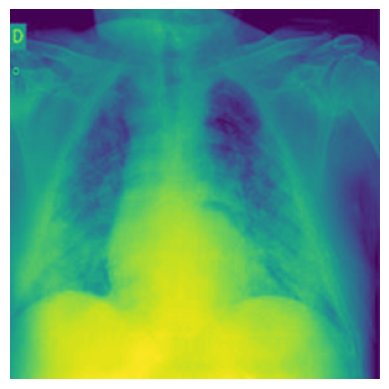

In [22]:
# Accessing and visualizing an image
covid_image_path = os.path.join(train_covid_dir, '/content/Data/covidsplit/train/covid/images/COVID-1484.png')
covid_image = mpimg.imread(covid_image_path)
plt.imshow(covid_image)
plt.axis('off')

(-0.5, 298.5, 298.5, -0.5)

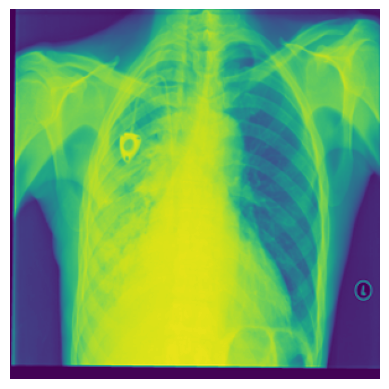

In [23]:
# Accessing and visualizing an image
lung_image_path = os.path.join(train_lung_dir, '/content/Data/covidsplit/train/lung/images/Lung_Opacity-5893.png')
lung_image = mpimg.imread(lung_image_path)
plt.imshow(lung_image)
plt.axis('off')

In [24]:
train_covid_images[:6]

['/content/Data/covidsplit/train/covid/images/COVID-1484.png',
 '/content/Data/covidsplit/train/covid/images/COVID-1259.png',
 '/content/Data/covidsplit/train/covid/images/COVID-2234.png',
 '/content/Data/covidsplit/train/covid/images/COVID-725.png',
 '/content/Data/covidsplit/train/covid/images/COVID-1850.png',
 '/content/Data/covidsplit/train/covid/images/COVID-1798.png']

In [25]:

train_covid_masks[:6]

['/content/Data/covidsplit/train/covid/masks/COVID-1484.png',
 '/content/Data/covidsplit/train/covid/masks/COVID-1259.png',
 '/content/Data/covidsplit/train/covid/masks/COVID-2234.png',
 '/content/Data/covidsplit/train/covid/masks/COVID-725.png',
 '/content/Data/covidsplit/train/covid/masks/COVID-1850.png',
 '/content/Data/covidsplit/train/covid/masks/COVID-1798.png']

In [26]:
train_pneumonia_masks[:6]

['/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-573.png',
 '/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-973.png',
 '/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-224.png',
 '/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-901.png',
 '/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-1119.png',
 '/content/Data/covidsplit/train/pneumonia/masks/Viral Pneumonia-215.png']

In [27]:
covid_images = train_covid_images[:20]
covid_masks = train_covid_masks[:20]
lung_images = train_lung_images[:20]
lung_masks = train_lung_masks[:20]
pneumonia_images = train_pneumonia_images[:20]
pneumonia_masks = train_pneumonia_masks[:20]
normal_images = train_normal_images[:20]
normal_masks = train_normal_masks[:20]

# Combine all the image and mask paths into one list
image_paths = covid_images + covid_masks + \
              lung_images + lung_masks + \
              pneumonia_images + pneumonia_masks + \
              normal_images + normal_masks

print(len(covid_images))
print(len(covid_masks))
print(len(lung_images))
print(len(lung_masks))
print(len(pneumonia_images))
print(len(pneumonia_masks))
print(len(normal_images))
print(len(normal_masks))


print(len(image_paths))



20
20
20
20
20
20
20
20
160


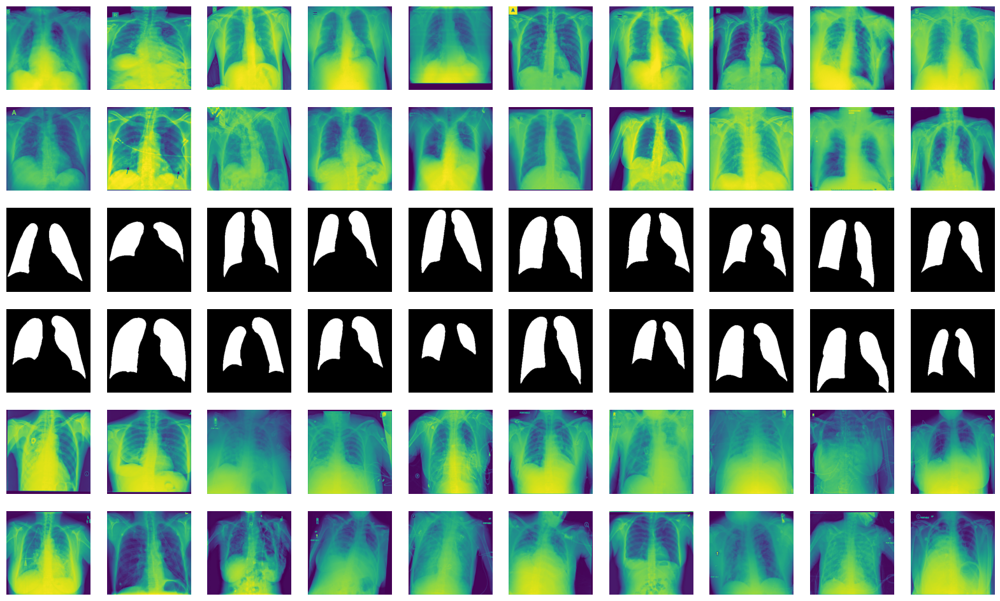

In [28]:
plt.figure(figsize = (20,12))
for i in range(60):
  plt.subplot(6,10,i+1)
  image = mpimg.imread(image_paths[i])
  plt.imshow(image)
  plt.axis('off')

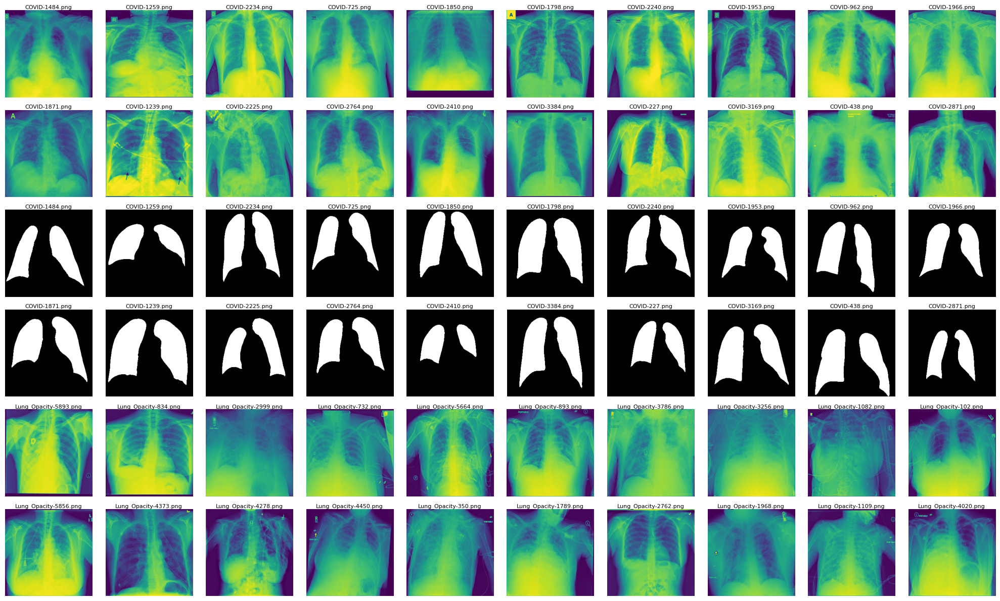

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.figure(figsize=(20, 12))
for i in range(60):
    plt.subplot(6, 10, i + 1)
    image = mpimg.imread(image_paths[i])
    plt.imshow(image)
    plt.axis('off')
    # Extracting the filename from the path
    filename = image_paths[i].split('/')[-1]
    # Displaying the filename as the title
    plt.title(filename, fontsize=8, pad=2)

plt.tight_layout()
plt.show()


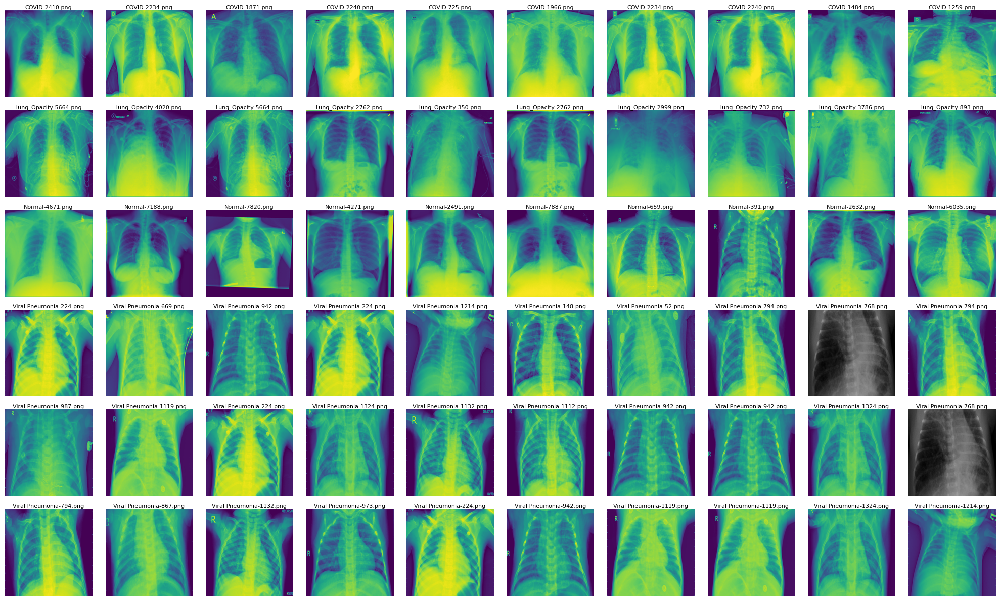

In [31]:
import random
plt.figure(figsize=(20, 12))
for i in range(60):
    plt.subplot(6, 10, i + 1)
    # Randomly select an image path from each category
    random_image_path = random.choice(covid_images)
    if i < 10:
        random_image_path = random.choice(covid_images)
    elif i < 20:
        random_image_path = random.choice(lung_images)
    elif i < 30:
        random_image_path = random.choice(normal_images)
    else:
        random_image_path = random.choice(pneumonia_images)

    image = mpimg.imread(random_image_path)
    plt.imshow(image)
    plt.axis('off')
    # Extracting the filename from the path
    filename = random_image_path.split('/')[-1]
    # Displaying the filename as the title
    plt.title(filename, fontsize=8, pad=2)

plt.tight_layout()
plt.show()

In [37]:
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 0.2,
    zoom_range = 0.2,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.1,
    vertical_flip = True,
    horizontal_flip = True
)

# Flow from directory is used when the data is on secondary storage
train_generator = train_datagen.flow_from_directory(
    train_dir,
    batch_size = 50,
    target_size = (200,200),
    class_mode = 'binary'
)

Found 40730 images belonging to 4 classes.


If you have trained a model using the provided code snippet and obtained a result where 40,000 images were classified into 4 classes, it implies the following:

1. **Data Augmentation**: The `ImageDataGenerator` is configured to perform various data augmentation techniques such as rotation, zooming, shifting, shearing, and flipping (both vertically and horizontally). These augmentations create modified versions of the original images, thereby increasing the diversity of the training dataset. This diversity helps prevent overfitting and improves the model's generalization ability.

2. **Training Data Size**: Since you mentioned that 40,000 images were classified into 4 classes, it suggests that your training dataset contains a total of 40,000 images distributed across these four classes.

3. **Class Imbalance**: Without further information, it's difficult to determine the distribution of images among the four classes. Class imbalance occurs when the number of images in each class is significantly different. In some cases, this can affect the model's performance, especially if the minority classes have fewer samples.

4. **Model Output**: The model is configured with a binary class mode (`class_mode='binary'`), which means it's likely designed for binary classification tasks. However, if you have 4 classes, this configuration may not be appropriate. You should use `'categorical'` for multi-class classification tasks.

5. **Model Training**: The `train_generator` is generated using `flow_from_directory`, which reads images from the specified directory (`train_dir`) and generates batches of augmented images during model training. The batch size is set to 50, and the target size of the images is (200, 200) pixels.





In summary, the result indicates that you have trained a model using a dataset of 40,000 images distributed among 4 classes, with data augmentation applied to improve model generalization. Further analysis and evaluation of the trained model's performance are necessary to assess its effectiveness for the intended task.